# Landuse accessibility


Install and update `cityseer` if necessary.


In [1]:
# !pip install --upgrade cityseer

## Data and preparation

This examples calculates landuse accessibility to pubs and restaurants for London

For additional information on network preparation, see the corresponding notebook on [graph cleaning](https://colab.research.google.com/github/cityseer/cityseer/blob/master/demos/graph_cleaning.ipynb).

This example will make use of OSM data downloaded from the [OSM API](https://wiki.openstreetmap.org/wiki/API) for a 5000m radius around London Soho.

The landuse amenity data is taken from `OpenStreetMap` via `osmnx`.


In [2]:
from cityseer.tools import graphs, io

# download from OSM
lng, lat = -0.13396079424572427, 51.51371088849723
buffer = 5000
plot_buffer = 3500
# creates a WGS shapely polygon
poly_wgs, poly_utm, _utm_zone_number, _utm_zone_letter = io.buffered_point_poly(
    lng, lat, buffer
)
plot_bbox = poly_utm.centroid.buffer(plot_buffer).bounds

INFO:cityseer.tools.io:UTM conversion info: UTM zone number: 30, UTM zone letter: U


Prepare the amenities GeoDataFrame.


In [3]:
# prepare data layer
from cityseer.metrics import layers
from osmnx import features

data_gdf = features.features_from_place(
    "london", tags={"amenity": ["pub", "restaurant"]}
)
data_gdf = data_gdf.to_crs(
    32630
)  # to match EPSG code for UTM zone 30N per network data
data_gdf = data_gdf.loc["node"]
data_gdf = data_gdf.reset_index(level=0, drop=True)
data_gdf.index = data_gdf.index.astype(str)
# convert to the same UTM CRS as the network
data_gdf = data_gdf[["amenity", "geometry"]]
print(data_gdf.head())

      amenity                        geometry
0         pub  POINT (694282.233 5720372.951)
1  restaurant  POINT (694353.653 5720508.222)
2         pub  POINT (694189.282 5720228.905)
3         pub  POINT (695475.171 5721895.793)
4         pub  POINT (709733.415 5720007.168)


Fetch and simplify the street network. The street network will be decomposed for a higher resolution analysis.


In [4]:
# generate OSM graph from polygon
G_utm = io.osm_graph_from_poly(poly_wgs, simplify=True, iron_edges=True)
# decompose for higher resolution analysis
G_decomp = graphs.nx_decompose(G_utm, 25)
# prepare the data structures
nodes_gdf, _edges_gdf, network_structure = io.network_structure_from_nx(
    G_decomp, crs=32629
)

INFO:cityseer.tools.io:Converting networkX graph from EPSG code 4326 to EPSG code 32630.
INFO:cityseer.tools.io:Processing node x, y coordinates.
100%|██████████| 156649/156649 [00:00<00:00, 448333.12it/s]
INFO:cityseer.tools.io:Processing edge geom coordinates, if present.
100%|██████████| 172955/172955 [00:00<00:00, 798543.70it/s]
INFO:cityseer.tools.graphs:Generating interpolated edge geometries.
100%|██████████| 172955/172955 [00:02<00:00, 68498.24it/s]
INFO:cityseer.tools.graphs:Removing filler nodes.
100%|██████████| 156649/156649 [00:24<00:00, 6332.56it/s]
INFO:cityseer.tools.graphs:Removing dangling nodes.
100%|██████████| 49687/49687 [00:00<00:00, 216481.47it/s]
INFO:cityseer.tools.graphs:Removing filler nodes.
100%|██████████| 43763/43763 [00:01<00:00, 38490.43it/s]
INFO:cityseer.tools.util:Creating nodes STR tree
100%|██████████| 40674/40674 [00:00<00:00, 91813.89it/s]
INFO:cityseer.tools.graphs:Consolidating nodes.
100%|██████████| 40674/40674 [00:13<00:00, 3052.61it/s]
INF

In [5]:
# compute pub accessibility - this should take around 3-4 minutes depending on resources
distances = [100, 200, 400, 800]
nodes_gdf, pubs_data_gdf = layers.compute_accessibilities(
    data_gdf,
    landuse_column_label="amenity",
    accessibility_keys=["pub", "restaurant"],
    nodes_gdf=nodes_gdf,
    network_structure=network_structure,
    distances=distances,
)

INFO:cityseer.metrics.layers:Computing land-use accessibility for: pub, restaurant
100%|██████████| 93142/93142 [03:14<00:00, 478.06it/s]


The output GeoDataFrame will contain new columns for each landuse and distance combination. For each of these the following will have been computed:

- A count of reachable instances of a given landuse (within the specified distance thresholds)
- Similarly, a distance-weighted count of reachable locations
- The distance to the nearest instance of a given landuse. Where there are no reachable landuses for a given node within the specified distance threshold, then a `np.inf` value will be returned.


/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d
/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d


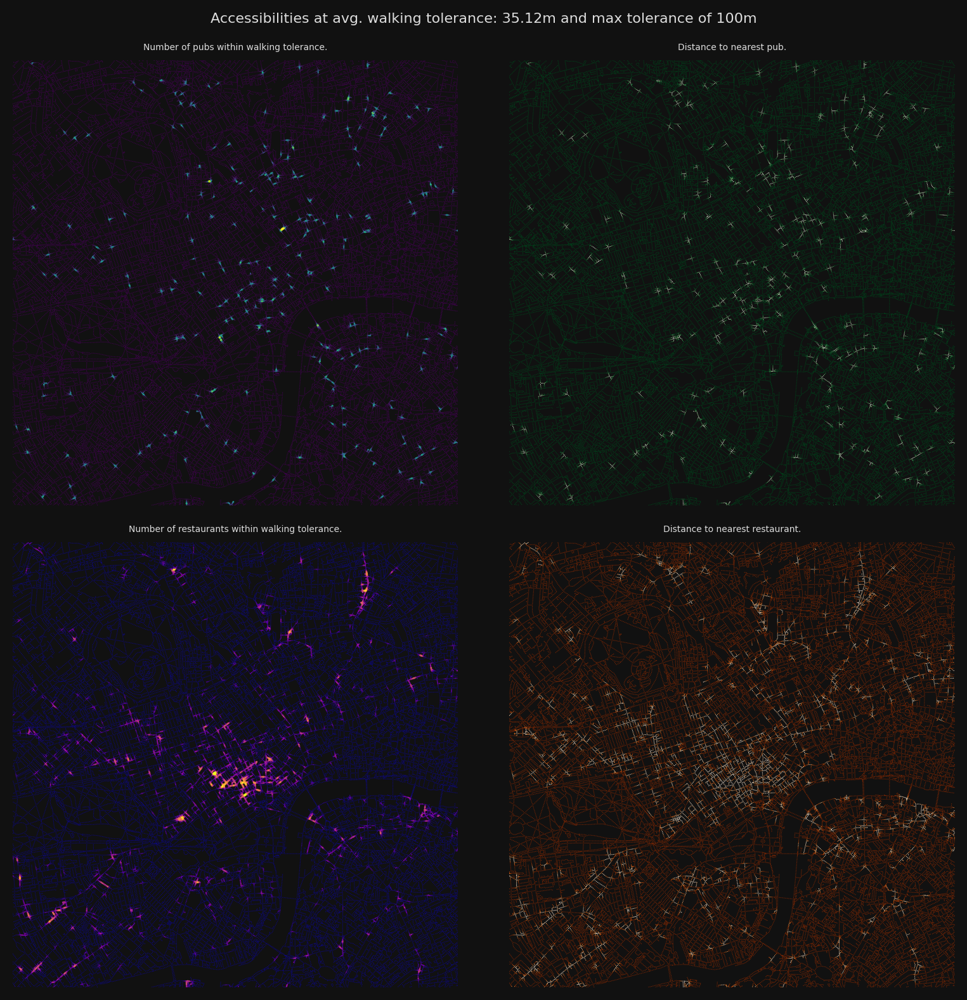

/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d
/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d


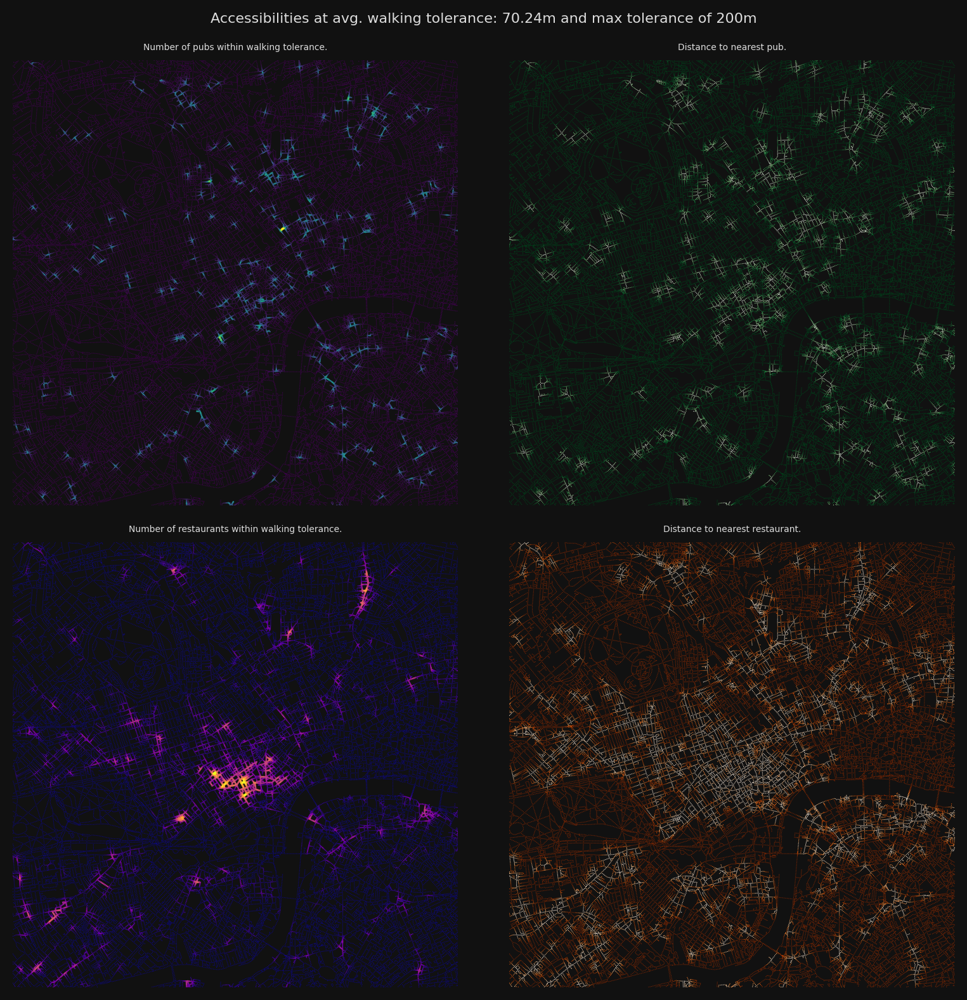

/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d
/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d


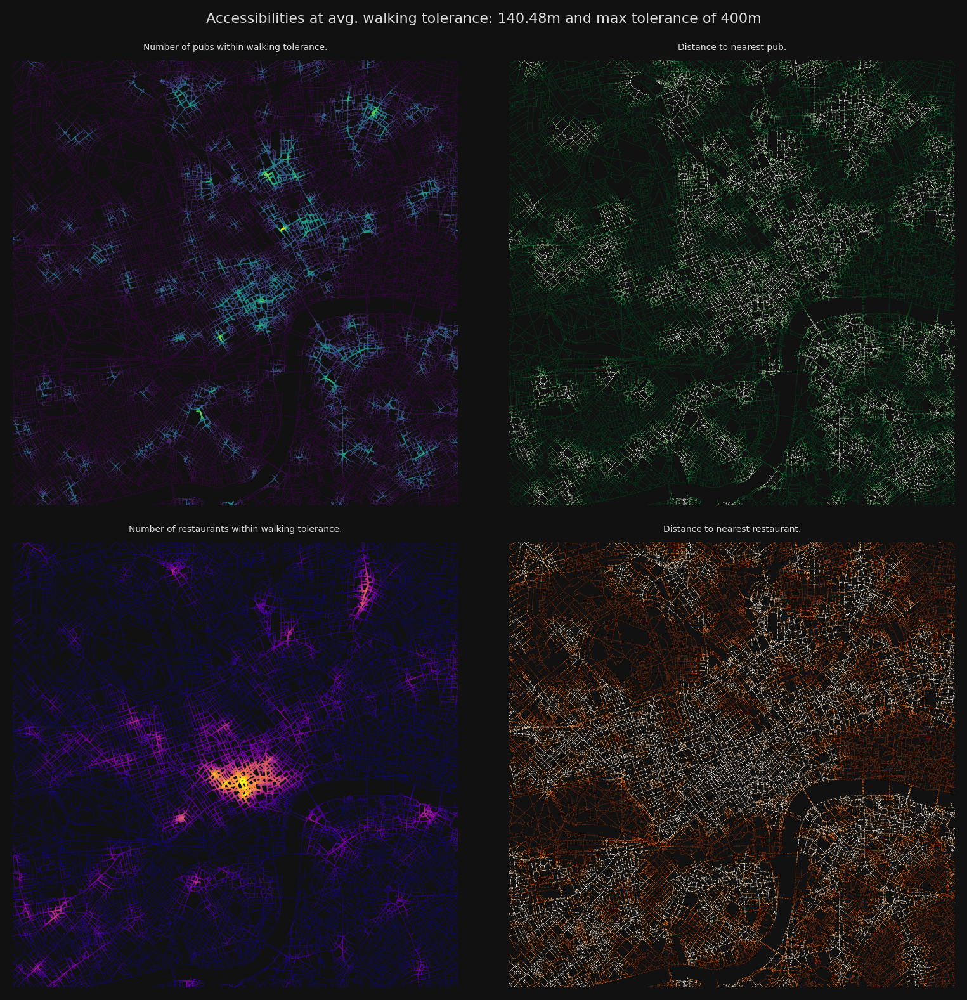

/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d
/var/folders/bs/sq3p18cs4dn1ws4kpmfyk_3c0000gn/T/ipykernel_35240/2035525140.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dist_data[np.isinf(dist_data)] = d


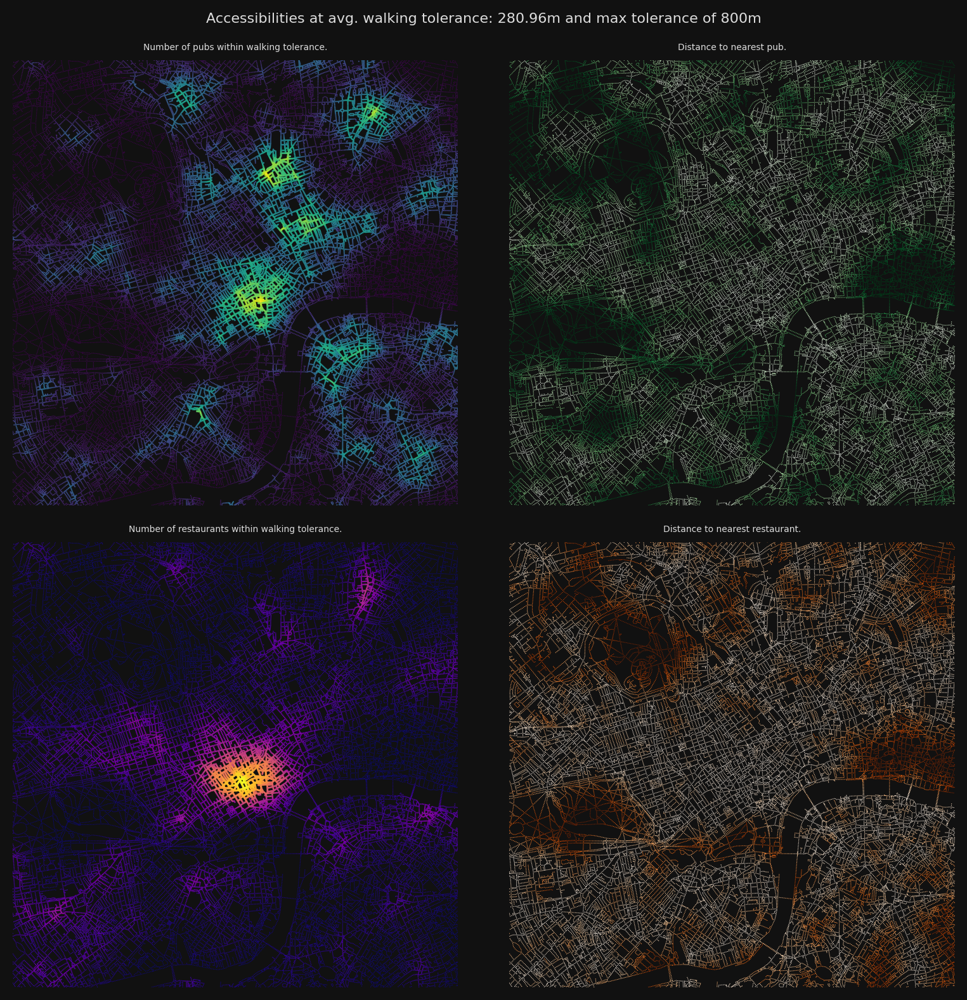

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from cityseer import rustalgos
from cityseer.tools import plot

betas = rustalgos.betas_from_distances(distances)
avg_dists = rustalgos.avg_distances_for_betas(betas)
for d, b, avg_d in zip(distances, betas, avg_dists):
    bg_colour = "#111"
    text_colour = "#ddd"
    font_size = 5
    fig, axes = plt.subplots(2, 2, figsize=(8, 8), dpi=200, facecolor=bg_colour)
    fig.suptitle(
        f"Accessibilities at avg. walking tolerance: {avg_d:.2f}m and max tolerance of {d}m",
        color=text_colour,
        fontsize=8,
    )
    plot.plot_scatter(
        axes[0][0],
        network_structure.node_xs,
        network_structure.node_ys,
        nodes_gdf[f"cc_metric_pub_{d}_weighted"],
        bbox_extents=plot_bbox,
        cmap_key="viridis",
        s_min=0.2,
        s_max=2,
        face_colour=bg_colour,
    )
    axes[0][0].set_title(
        "Number of pubs within walking tolerance.",
        color=text_colour,
        fontsize=font_size,
    )
    dist_data = nodes_gdf[f"cc_metric_pub_{d}_distance"]
    dist_data[np.isinf(dist_data)] = d
    plot.plot_scatter(
        axes[0][1],
        network_structure.node_xs,
        network_structure.node_ys,
        dist_data,
        bbox_extents=plot_bbox,
        cmap_key="Greens",
        s_min=0.2,
        s_max=0.21,
        face_colour=bg_colour,
    )
    axes[0][1].set_title(
        "Distance to nearest pub.", color=text_colour, fontsize=font_size
    )
    plot.plot_scatter(
        axes[1][0],
        network_structure.node_xs,
        network_structure.node_ys,
        nodes_gdf[f"cc_metric_restaurant_{d}_weighted"],
        bbox_extents=plot_bbox,
        cmap_key="plasma",
        s_min=0.2,
        s_max=2,
        face_colour=bg_colour,
    )
    axes[1][0].set_title(
        "Number of restaurants within walking tolerance.",
        color=text_colour,
        fontsize=font_size,
    )
    dist_data = nodes_gdf[f"cc_metric_restaurant_{d}_distance"]
    dist_data[np.isinf(dist_data)] = d
    plot.plot_scatter(
        axes[1][1],
        network_structure.node_xs,
        network_structure.node_ys,
        nodes_gdf[f"cc_metric_restaurant_{d}_distance"],
        bbox_extents=plot_bbox,
        cmap_key="Oranges",
        s_min=0.2,
        s_max=0.21,
        face_colour=bg_colour,
    )
    axes[1][1].set_title(
        "Distance to nearest restaurant.", color=text_colour, fontsize=font_size
    )
    fig.tight_layout()
    plt.show()